In [1]:
from IPython.display import clear_output
import pandas as pd 
import subprocess #run R code from subprocess
import numpy as np
from os import listdir # get dir list
from os.path import isfile, join # get dir list


import concurrent.futures
import time
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import KFold, cross_validate
from sklearn.model_selection import cross_val_score, cross_validate
from sklearn.metrics import make_scorer, accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
import pickle

In [2]:
def buldDictOfDatasetsByNumber(df):
    indexList = df.index
    numberDict ={}
    for i in indexList:
        n = i.split('_')[0]
        if n in numberDict:
            numberDict[n].append(i)
        else:
            numberDict[n] = [i]
    return numberDict

from sklearn.neighbors import KNeighborsRegressor
def trainKNNAndReturnPredictions(df= None, cols = list(range(0, 97)), metricName = None, numberDict = None, type = None):
    df0 = pd.DataFrame()
    # features = []
    count = 0
    for i in numberDict:
        KNN = KNeighborsRegressor(n_jobs=90)
        train = df.drop(df.loc[numberDict[i],:].index, axis =0)
        pred = df.loc[numberDict[i],:]
    #     X = train.iloc[:, : 73]
        X = train.iloc[:, cols]
        y = train.iloc[:, 97: ]
        KNN.fit(X, y)
        result = KNN.predict(pred.iloc[:, cols])
    #     result = KNN.predict(pred.iloc[:, : 73])
        resultDF = pd.DataFrame(result, columns = pred.columns[97:])
        resultDF.index = pred.index
        if df0.empty:
            df0 = resultDF.copy()
            # features = KNN.feature_importances_
        else:
            df0 = df0.append(resultDF.copy())
            # features = np.append(features, KNN.feature_importances_)
        clear_output(wait=True)
        count +=1
        print ("exec - "+ type + ' -' + str(count) + " / " + str(len(numberDict)))
    # result = KNN.predict()
    df0.to_csv(f'RankingResults/results_KNN_{metricName}-{type}.csv.zip')
    # features = np.array_split(features, len(numberDict))
    # pickle.dump(features, open(f'RankingResults/features_KNN_{metricName}-{type}.p', "wb"))  # save it into a file named save.p
    return df0

def trainKNNAndReturnPredictionsNoHyper(df= None, cols = list(range(0, 97)), metricName = None, numberDict = None, type = None, noHyperCols = None):
    df0 = pd.DataFrame()
    # features = []
    count = 0
    for i in numberDict:
        KNN = KNeighborsRegressor(n_jobs=90)
        train = df.drop(df.loc[numberDict[i],:].index, axis =0)
        pred = df.loc[numberDict[i],:]
    #     X = train.iloc[:, : 73]
        X = train.iloc[:, cols]
        y = train[noHyperCols]
        KNN.fit(X, y)
        result = KNN.predict(pred.iloc[:, cols])
    #     result = KNN.predict(pred.iloc[:, : 73])
        resultDF = pd.DataFrame(result, columns = noHyperCols)
        resultDF.index = pred.index
        if df0.empty:
            df0 = resultDF.copy()
            # features = KNN.feature_importances_
        else:
            df0 = df0.append(resultDF.copy())
            # features = np.append(features, KNN.feature_importances_)
        clear_output(wait=True)
        count +=1
        print ("exec - "+ type + ' -' + str(count) + " / " + str(len(numberDict)))
    # result = KNN.predict()
    df0.to_csv(f'RankingResults/results_KNN_{metricName}-{type}-NoHyper.csv.zip')
    # features = np.array_split(features, len(numberDict))
    # pickle.dump(features, open(f'RankingResults/features_KNN_{metricName}-{type}-NoHyper.p', "wb"))  # save it into a file named save.p
    return df0



def trainKNNAndReturnPredictionsNoHyperSplit(df= None, cols = list(range(0, 97)), metricName = None, numberDict = None, type = None, noHyperCols = None):
    df0 = pd.DataFrame()
    features = []
    count = 0
    for i in numberDict:
        results = []
        for label in noHyperCols:
            KNN = KNeighborsRegressor(n_jobs=90)
            train = df.drop(df.loc[numberDict[i],:].index, axis =0)
            pred = df.loc[numberDict[i],:]
        #     X = train.iloc[:, : 73]
            X = train.iloc[:, cols]
            y = train[label]
            KNN.fit(X, y)
            result = KNN.predict(pred.iloc[:, cols])
        #     result = KNN.predict(pred.iloc[:, : 73])
            results.append(result)
        resultDF = pd.DataFrame(np.array(results).T, columns = noHyperCols)
        if df0.empty:
            df0 = resultDF.copy()
            features = KNN.feature_importances_
        else:
            df0 = df0.append(resultDF.copy())
            features = np.append(features, KNN.feature_importances_)
        clear_output(wait=True)
        count +=1
        print ("exec - "+ type + ' -' + str(count) + " / " + str(len(numberDict)))
    # result = KNN.predict()
    df0.to_csv(f'RankingResults/results_KNN_{metricName}-{type}-NoHyperSplit.csv.zip')
    features = np.array_split(features, len(numberDict))
    # pickle.dump(features, open(f'RankingResults/features_KNN_{metricName}-{type}-NoHyper.p', "wb"))  # save it into a file named save.p
    return df0, features


    

In [4]:

metabase = {'DT': pd.read_csv('Metabases/Metabase_DT.csv.zip', index_col='Dataset'), 'RF': pd.read_csv('Metabases/Metabase_RF.csv.zip', index_col='Dataset'), 'KNN': pd.read_csv('Metabases/Metabase_KNN.csv.zip', index_col='Dataset') }
numberDict = buldDictOfDatasetsByNumber(metabase['DT'])
metricName = 'f1-score'
start = time.perf_counter()
with concurrent.futures.ProcessPoolExecutor(3) as executor:
#                 results = executor.map(runMFE, smallSet)
    results = [executor.submit(trainKNNAndReturnPredictions, metabase[i], list(range(0, 97)), metricName, numberDict, i) for i in metabase]
    for s in concurrent.futures.as_completed(results):
        end = time.perf_counter()
        print(f'tempo total: {int((end-start)/60)} min {int((end-start)%60)} s' )
        # df0, features = s.result()

# df0, features = trainRFAndReturnPredictions(df= df, metricName = metricName, numberDict = numberDict)
# RF = RandomForestRegressor(random_state=0, n_jobs=80)
# train = df.drop(df.loc[buldDictOfDatasetsByNumber(df)['1004'],:].index, axis =0)
# pred = df.loc[buldDictOfDatasetsByNumber(df)['1004'],:]
# X = train.iloc[:, list(range(0, 97))]
# y = train.iloc[:, 97: ]
# RF.fit(X, y)
# result = RF.predict(pred.iloc[:, list(range(0, 97))])

exec - RF -358 / 358
tempo total: 1 min 32 s
tempo total: 1 min 33 s
tempo total: 1 min 33 s


In [3]:

metabase = {'DT': pd.read_csv('Metabases/Metabase_DT.csv.zip', index_col='Dataset'), 'RF': pd.read_csv('Metabases/Metabase_RF.csv.zip', index_col='Dataset'), 'KNN': pd.read_csv('Metabases/Metabase_KNN.csv.zip', index_col='Dataset'),
 'SVM': pd.read_csv('Metabases/Metabase_SVM.csv.zip', index_col='Dataset') }
numberDict = buldDictOfDatasetsByNumber(metabase['DT'])
metricName = 'f1-score'
start = time.perf_counter()
result = trainKNNAndReturnPredictions( metabase['SVM'], list(range(0, 97)), metricName, numberDict, 'SVM')
end = time.perf_counter()
print(f'tempo total: {int((end-start)/60)} min {int((end-start)%60)} s' )

exec - SVM -358 / 358
tempo total: 0 min 32 s


In [5]:
noHyperCols = ['test_f1_macro_mean_AENN-5',
       'test_f1_macro_mean_edgeBoostFilter-15', 'test_f1_macro_mean_PRISM','test_f1_macro_mean_HARF-70',
       'test_f1_macro_mean_GE-5','test_f1_macro_mean_dynamicCF','test_f1_macro_mean_hybridRepairFilter','test_f1_macro_mean_ORBoost-11']

metabase = {'DT': pd.read_csv('Metabases/Metabase_DT.csv.zip', index_col='Dataset'), 'RF': pd.read_csv('Metabases/Metabase_RF.csv.zip', index_col='Dataset'), 'KNN': pd.read_csv('Metabases/Metabase_KNN.csv.zip', index_col='Dataset') }
numberDict = buldDictOfDatasetsByNumber(metabase['DT'])
metricName = 'f1-score'
start = time.perf_counter()
with concurrent.futures.ProcessPoolExecutor(3) as executor:
#                 results = executor.map(runMFE, smallSet)
    results = [executor.submit(trainKNNAndReturnPredictionsNoHyper, metabase[i], list(range(0, 97)), metricName, numberDict, i, noHyperCols) for i in metabase]
    for s in concurrent.futures.as_completed(results):
        end = time.perf_counter()
        print(f'tempo total: {int((end-start)/60)} min {int((end-start)%60)} s' )
        # df0, features = s.result()


exec - DT -358 / 358
tempo total: 1 min 34 s
tempo total: 1 min 34 s
tempo total: 1 min 34 s


In [4]:
noHyperCols = ['test_f1_macro_mean_AENN-5',
       'test_f1_macro_mean_edgeBoostFilter-15', 'test_f1_macro_mean_PRISM','test_f1_macro_mean_HARF-70',
       'test_f1_macro_mean_GE-5','test_f1_macro_mean_dynamicCF','test_f1_macro_mean_hybridRepairFilter','test_f1_macro_mean_ORBoost-11']

metabase = {'DT': pd.read_csv('Metabases/Metabase_DT.csv.zip', index_col='Dataset'), 'RF': pd.read_csv('Metabases/Metabase_RF.csv.zip', index_col='Dataset'), 'KNN': pd.read_csv('Metabases/Metabase_KNN.csv.zip', index_col='Dataset'),
 'SVM': pd.read_csv('Metabases/Metabase_SVM.csv.zip', index_col='Dataset') }
numberDict = buldDictOfDatasetsByNumber(metabase['DT'])
metricName = 'f1-score'
start = time.perf_counter()
result = trainKNNAndReturnPredictionsNoHyper( metabase['SVM'], list(range(0, 97)), metricName, numberDict, 'SVM', noHyperCols)
end = time.perf_counter()
print(f'tempo total: {int((end-start)/60)} min {int((end-start)%60)} s' )

exec - SVM -358 / 358
tempo total: 0 min 31 s


In [25]:
noHyperCols = ['test_f1_macro_mean_AENN-5',
       'test_f1_macro_mean_edgeBoostFilter-15', 'test_f1_macro_mean_PRISM','test_f1_macro_mean_HARF-70',
       'test_f1_macro_mean_GE-5','test_f1_macro_mean_dynamicCF','test_f1_macro_mean_hybridRepairFilter','test_f1_macro_mean_ORBoost-11']

metabase = {'DT': pd.read_csv('Metabases/Metabase_DT.csv.zip', index_col='Dataset'), 'RF': pd.read_csv('Metabases/Metabase_RF.csv.zip', index_col='Dataset'), 'KNN': pd.read_csv('Metabases/Metabase_KNN.csv.zip', index_col='Dataset') }
numberDict = buldDictOfDatasetsByNumber(metabase['DT'])
metricName = 'f1-score'
start = time.perf_counter()

trainRFAndReturnPredictionsNoHyperSplit( metabase['DT'], list(range(0, 97)), metricName, numberDict, 'DT', noHyperCols )
# with concurrent.futures.ProcessPoolExecutor(3) as executor:
# #                 results = executor.map(runMFE, smallSet)
#     results = [executor.submit() for i in metabase]
#     for s in concurrent.futures.as_completed(results):
#         end = time.perf_counter()
#         print(f'tempo total: {int((end-start)/60)} min {int((end-start)%60)} s' )
#         # df0, features = s.result()

exec - DT -358 / 358


(    test_f1_macro_mean_AENN-5  test_f1_macro_mean_edgeBoostFilter-15  \
 0                    0.601220                               0.766755   
 1                    0.534829                               0.788466   
 2                    0.641019                               0.729129   
 3                    0.509381                               0.782573   
 4                    0.605112                               0.747559   
 ..                        ...                                    ...   
 25                   0.880915                               0.784034   
 26                   0.871626                               0.781730   
 27                   0.877078                               0.783440   
 28                   0.871382                               0.769369   
 29                   0.864374                               0.767272   
 
     test_f1_macro_mean_PRISM  test_f1_macro_mean_HARF-70  \
 0                   0.712264                    0.908067   


In [30]:
df = pd.read_csv('RankingResults/results_RF_f1-score-DT-NoHyperSplit.csv.zip').drop('Unnamed: 0', axis =1)
rank = pd.DataFrame()
for i, a in enumerate(df.index):
    rank = rank.append(df.iloc[i].rank(method = 'dense', ascending = False))
#get the best algorithm list




best = rank.idxmin(axis=1)
best.value_counts()

/tmp/ipykernel_1456461/3768508.py:4: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  rank = rank.append(df.iloc[i].rank(method = 'dense', ascending = False))
/tmp/ipykernel_1456461/3768508.py:4: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  rank = rank.append(df.iloc[i].rank(method = 'dense', ascending = False))
/tmp/ipykernel_1456461/3768508.py:4: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  rank = rank.append(df.iloc[i].rank(method = 'dense', ascending = False))
/tmp/ipykernel_1456461/3768508.py:4: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  rank = rank.append(df.iloc[i].rank(method = 'dense', ascending = False))
/tmp/ipykernel_14564

test_f1_macro_mean_dynamicCF             7620
test_f1_macro_mean_ORBoost-11             787
test_f1_macro_mean_GE-5                   705
test_f1_macro_mean_hybridRepairFilter     584
test_f1_macro_mean_HARF-70                478
test_f1_macro_mean_AENN-5                 465
test_f1_macro_mean_PRISM                   70
test_f1_macro_mean_edgeBoostFilter-15      31
dtype: int64

In [13]:
best.value_counts()

test_f1_macro_mean_dynamicCF             8627
test_f1_macro_mean_GE-5                   761
test_f1_macro_mean_ORBoost-11             548
test_f1_macro_mean_HARF-70                496
test_f1_macro_mean_hybridRepairFilter     223
test_f1_macro_mean_AENN-5                  84
test_f1_macro_mean_PRISM                    1
dtype: int64

In [18]:
noHyperCols = ['test_f1_macro_mean_AENN-5',
       'test_f1_macro_mean_edgeBoostFilter-15', 'test_f1_macro_mean_PRISM','test_f1_macro_mean_HARF-70',
       'test_f1_macro_mean_GE-5','test_f1_macro_mean_dynamicCF','test_f1_macro_mean_hybridRepairFilter','test_f1_macro_mean_ORBoost-11']
df = pd.read_csv('Metabases/Metabase_RF.csv.zip', index_col= 'Dataset').iloc[:,97:]
# df = pd.read_csv('RankingResults/results_RF_f1-score-DT-NoHyper.csv.zip', index_col= 'Dataset')


rank = pd.DataFrame()
for i, a in enumerate(df.index):
    rank = rank.append(df.iloc[i].rank(method = 'dense', ascending = False))
#get the best algorithm list




best = rank.idxmin(axis=1)
best.value_counts()

/tmp/ipykernel_1456461/1319965343.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  rank = rank.append(df.iloc[i].rank(method = 'dense', ascending = False))
/tmp/ipykernel_1456461/1319965343.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  rank = rank.append(df.iloc[i].rank(method = 'dense', ascending = False))
/tmp/ipykernel_1456461/1319965343.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  rank = rank.append(df.iloc[i].rank(method = 'dense', ascending = False))
/tmp/ipykernel_1456461/1319965343.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  rank = rank.append(df.iloc[i].rank(method = 'dense', ascending = False))
/tmp

test_f1_macro_mean_ORBoost-3             2863
test_f1_macro_mean_dynamicCF             1943
test_f1_macro_mean_ORBoost-19            1380
test_f1_macro_mean_ORBoost-7             1046
test_f1_macro_mean_AENN-11                632
test_f1_macro_mean_ORBoost-15             570
test_f1_macro_mean_ORBoost-11             561
test_f1_macro_mean_hybridRepairFilter     308
test_f1_macro_mean_GE-11                  161
test_f1_macro_mean_AENN-9                 140
test_f1_macro_mean_GE-5                   134
test_f1_macro_mean_edgeBoostFilter-20     134
test_f1_macro_mean_GE-9                   129
test_f1_macro_mean_AENN-7                 117
test_f1_macro_mean_GE-7                   113
test_f1_macro_mean_AENN-3                  87
test_f1_macro_mean_GE-3                    83
test_f1_macro_mean_AENN-5                  73
test_f1_macro_mean_edgeBoostFilter-5       63
test_f1_macro_mean_edgeBoostFilter-15      56
test_f1_macro_mean_HARF-70                 52
test_f1_macro_mean_HARF-75        

In [12]:
def getRank(df):
    columns = df.columns
    columns
    for ind, values in enumerate(df.values):
        for pos, x in enumerate(np.sort(values)):
            for col in columns:
                if df.iloc[ind][col] == x:
                    df.iloc[ind][col] = int(pos)
    return df

df0 = pd.read_csv('RankingResults/results_RF_f1-score-RF.csv.zip', index_col= 'Dataset')
display(df0)
df.iloc[:, 97: ]

getRank(df.iloc[:, 97: ])

,test_f1_macro_mean_ORBoost-19,test_f1_macro_mean_AENN-11,test_f1_macro_mean_AENN-3,test_f1_macro_mean_HARF-75,test_f1_macro_mean_GE-7,test_f1_macro_mean_ORBoost-3,test_f1_macro_mean_HARF-90,test_f1_macro_mean_HARF-80,test_f1_macro_mean_AENN,test_f1_macro_mean_ORBoost-15,...,test_f1_macro_mean_AENN-9,test_f1_macro_mean_GE-5,test_f1_macro_mean_HARF-85,test_f1_macro_mean_GE-11,test_f1_macro_mean_dynamicCF,test_f1_macro_mean_edgeBoostFilter-10,test_f1_macro_mean_hybridRepairFilter,test_f1_macro_mean_ORBoost-7,test_f1_macro_mean_ORBoost-11,test_f1_macro_mean_GE-3
Dataset,,,,,,,,,,,,,,,,,,,,,
1004_synthetic_control_10_0.csv.gz,0.753162,0.851850,0.816583,0.801803,0.818923,0.705783,0.728905,0.779273,0.828098,0.683893,...,0.848678,0.836522,0.755149,0.820707,0.879044,0.693567,0.848283,0.751816,0.703496,0.793793
1004_synthetic_control_10_1.csv.gz,0.759738,0.849069,0.814792,0.803760,0.820949,0.683249,0.728141,0.780368,0.826350,0.691599,...,0.843990,0.834262,0.753690,0.821736,0.878300,0.691585,0.847353,0.706574,0.671702,0.790638
1004_synthetic_control_10_2.csv.gz,0.770745,0.859559,0.824233,0.805264,0.822402,0.716725,0.722705,0.776231,0.838873,0.709084,...,0.859034,0.839065,0.751687,0.834846,0.885978,0.707120,0.865270,0.759443,0.703775,0.790392
1004_synthetic_control_10_3.csv.gz,0.714742,0.822454,0.823772,0.835688,0.827429,0.740536,0.778522,0.814334,0.831782,0.677014,...,0.831946,0.825692,0.802463,0.804928,0.865188,0.757672,0.848025,0.673387,0.659110,0.809118
1004_synthetic_control_10_4.csv.gz,0.761394,0.858966,0.824655,0.807844,0.823291,0.726289,0.731865,0.785061,0.834640,0.710874,...,0.854932,0.850960,0.757348,0.833507,0.884692,0.708578,0.852027,0.773997,0.725761,0.800738
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
997_balance-scale_5_5.csv.gz,0.847588,0.952156,0.936986,0.902398,0.921775,0.959721,0.848306,0.880329,0.944376,0.927903,...,0.952270,0.897860,0.863046,0.943501,0.981841,0.875304,0.964660,0.725285,0.934441,0.886451
997_balance-scale_5_6.csv.gz,0.808554,0.942875,0.919726,0.878204,0.906898,0.956909,0.818704,0.854945,0.928706,0.916098,...,0.941987,0.881750,0.835371,0.925964,0.975697,0.852105,0.953784,0.784835,0.914135,0.866598
997_balance-scale_5_7.csv.gz,0.849163,0.953040,0.936706,0.902314,0.923415,0.942192,0.847222,0.880690,0.944904,0.928380,...,0.953166,0.900018,0.863587,0.942660,0.981107,0.874871,0.962641,0.760601,0.935232,0.887258


""
Dataset
1004_synthetic_control_10_0.csv.gz
1004_synthetic_control_10_1.csv.gz
1004_synthetic_control_10_2.csv.gz
1004_synthetic_control_10_3.csv.gz
1004_synthetic_control_10_4.csv.gz
...
997_balance-scale_5_5.csv.gz
997_balance-scale_5_6.csv.gz
997_balance-scale_5_7.csv.gz


In [5]:
b1 = pd.DataFrame()
for i in a1.columns:
    b1 = b1.append(a1[i].value_counts())
b1.columns = b1.columns.sort_values()
b1

NameError: name 'a1' is not defined

/tmp/ipykernel_703054/2551760113.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  b = b.append(a1[i].value_counts())
/tmp/ipykernel_703054/2551760113.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  b = b.append(a1[i].value_counts())
/tmp/ipykernel_703054/2551760113.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  b = b.append(a1[i].value_counts())
/tmp/ipykernel_703054/2551760113.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  b = b.append(a1[i].value_counts())
/tmp/ipykernel_703054/2551760113.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat i

,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,11.0,12.0,13.0,14.0,15.0,16.0,17.0,18.0,19.0,20.0,21.0,22.0,23.0,24.0,25.0,26.0,27.0
test_f1_macro_mean_ORBoost-19,1382,1065,1014,900,746,421,222,167,113,110,89,82,92,72,89,94,142,140,200,242,306,534,561,540,571,529,317
test_f1_macro_mean_AENN-11,802,549,791,889,978,1043,1370,1138,671,417,338,238,205,154,142,131,150,148,119,115,108,86,70,46,27,14,1
test_f1_macro_mean_AENN-3,218,134,201,242,291,360,392,546,655,771,945,1001,1071,910,821,668,492,342,234,148,100,69,58,30,23,14,4
test_f1_macro_mean_HARF-75,129,106,169,162,185,187,224,247,279,346,396,507,560,645,826,970,915,977,983,819,539,239,148,88,57,23,14
test_f1_macro_mean_GE-7,299,239,246,309,366,377,388,460,488,556,660,607,686,790,756,632,471,403,323,250,197,178,204,249,294,182,130
test_f1_macro_mean_ORBoost-3,3396,1447,996,719,556,335,219,161,136,118,87,81,74,69,69,89,112,115,132,147,183,377,357,220,186,193,166
test_f1_macro_mean_HARF-90,36,25,60,68,63,71,76,107,108,127,131,150,188,227,260,319,386,544,706,839,935,996,1032,1095,1014,736,441
test_f1_macro_mean_HARF-80,76,62,93,117,121,147,170,183,210,226,254,284,376,429,526,702,861,859,932,1007,1034,925,543,312,173,82,36
test_f1_macro_mean_AENN,347,190,301,355,390,500,633,761,868,1048,1070,1012,807,645,508,356,295,200,121,108,75,71,35,20,13,10,1
test_f1_macro_mean_ORBoost-15,1332,1138,1124,1067,762,419,220,179,141,108,121,85,77,63,73,87,143,145,184,244,304,492,531,578,576,444,103


<AxesSubplot:>

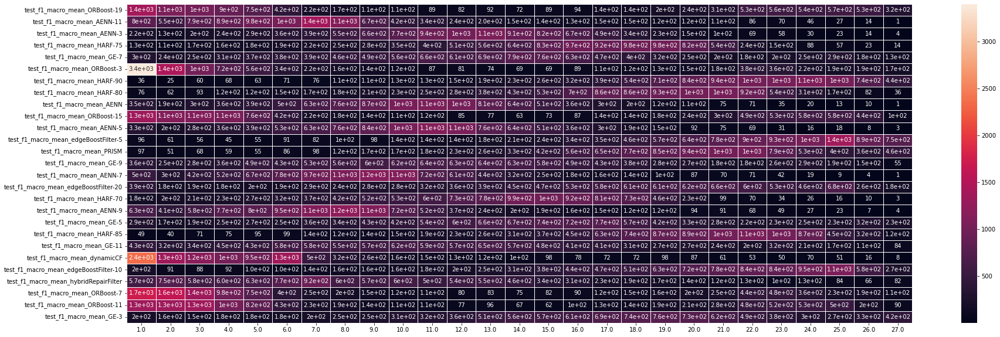

In [44]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
pd.set_option('display.max_columns', None)
b = pd.DataFrame()
for i in a1.columns:
    b = b.append(a1[i].value_counts())
b.columns 
display(b[b.columns.sort_values()])
# sns.heatmap(b[b.columns.sort_values()])

plt.subplots(figsize=(30,10))         # Sample figsize in inches
sns.heatmap(b[b.columns.sort_values()], annot=True, linewidths=1)

In [10]:
df0.columns

Index(['test_f1_macro_mean_ORBoost-19', 'test_f1_macro_mean_AENN-11',
       'test_f1_macro_mean_AENN-3', 'test_f1_macro_mean_HARF-75',
       'test_f1_macro_mean_GE-7', 'test_f1_macro_mean_ORBoost-3',
       'test_f1_macro_mean_HARF-90', 'test_f1_macro_mean_HARF-80',
       'test_f1_macro_mean_AENN', 'test_f1_macro_mean_ORBoost-15',
       'test_f1_macro_mean_AENN-5', 'test_f1_macro_mean_edgeBoostFilter-5',
       'test_f1_macro_mean_PRISM', 'test_f1_macro_mean_GE-9',
       'test_f1_macro_mean_AENN-7', 'test_f1_macro_mean_edgeBoostFilter-20',
       'test_f1_macro_mean_HARF-70', 'test_f1_macro_mean_AENN-9',
       'test_f1_macro_mean_GE-5', 'test_f1_macro_mean_HARF-85',
       'test_f1_macro_mean_GE-11', 'test_f1_macro_mean_dynamicCF',
       'test_f1_macro_mean_edgeBoostFilter-10',
       'test_f1_macro_mean_hybridRepairFilter', 'test_f1_macro_mean_ORBoost-7',
       'test_f1_macro_mean_ORBoost-11', 'test_f1_macro_mean_GE-3'],
      dtype='object')

In [43]:
df = pd.read_csv('Metabases/Metabase_RF.csv.zip', index_col= 'Dataset')
# df = df.drop(['test_f1_macro_mean_ORBoost-3', 'test_f1_macro_mean_ORBoost-7', 'test_f1_macro_mean_ORBoost-11', 'test_f1_macro_mean_ORBoost-15', 'test_f1_macro_mean_ORBoost-19', 'test_f1_macro_mean_dynamicCF'], axis=1)
ind = df0.index
a1 = pd.DataFrame()
for i, value in enumerate(ind):
# (df.iloc[:, 97: ]).iloc[i].rank(method = 'dense', ascending = False)
    a1 = a1.append((df.iloc[:, 97: ]).iloc[i].rank(method = 'dense', ascending = False))
a1

/tmp/ipykernel_703054/3242143147.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  a1 = a1.append((df.iloc[:, 97: ]).iloc[i].rank(method = 'dense', ascending = False))
/tmp/ipykernel_703054/3242143147.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  a1 = a1.append((df.iloc[:, 97: ]).iloc[i].rank(method = 'dense', ascending = False))
/tmp/ipykernel_703054/3242143147.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  a1 = a1.append((df.iloc[:, 97: ]).iloc[i].rank(method = 'dense', ascending = False))
/tmp/ipykernel_703054/3242143147.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  a1 = a1.append((df.iloc[:, 97: ]).iloc[i].rank(me

,test_f1_macro_mean_ORBoost-19,test_f1_macro_mean_AENN-11,test_f1_macro_mean_AENN-3,test_f1_macro_mean_HARF-75,test_f1_macro_mean_GE-7,test_f1_macro_mean_ORBoost-3,test_f1_macro_mean_HARF-90,test_f1_macro_mean_HARF-80,test_f1_macro_mean_AENN,test_f1_macro_mean_ORBoost-15,test_f1_macro_mean_AENN-5,test_f1_macro_mean_edgeBoostFilter-5,test_f1_macro_mean_PRISM,test_f1_macro_mean_GE-9,test_f1_macro_mean_AENN-7,test_f1_macro_mean_edgeBoostFilter-20,test_f1_macro_mean_HARF-70,test_f1_macro_mean_AENN-9,test_f1_macro_mean_GE-5,test_f1_macro_mean_HARF-85,test_f1_macro_mean_GE-11,test_f1_macro_mean_dynamicCF,test_f1_macro_mean_edgeBoostFilter-10,test_f1_macro_mean_hybridRepairFilter,test_f1_macro_mean_ORBoost-7,test_f1_macro_mean_ORBoost-11,test_f1_macro_mean_GE-3
1004_synthetic_control_10_0.csv.gz,4.0,1.0,10.0,12.0,14.0,5.0,25.0,18.0,6.0,7.0,11.0,26.0,21.0,19.0,3.0,15.0,13.0,2.0,24.0,23.0,16.0,8.0,22.0,20.0,9.0,1.0,17.0
1004_synthetic_control_10_1.csv.gz,14.0,1.0,17.0,6.0,22.0,19.0,25.0,21.0,16.0,11.0,23.0,26.0,12.0,18.0,2.0,4.0,5.0,3.0,10.0,15.0,20.0,7.0,27.0,8.0,13.0,9.0,24.0
1004_synthetic_control_10_2.csv.gz,1.0,3.0,9.0,8.0,12.0,1.0,19.0,17.0,9.0,4.0,9.0,21.0,14.0,15.0,6.0,7.0,1.0,5.0,11.0,16.0,13.0,2.0,20.0,10.0,1.0,2.0,18.0
1004_synthetic_control_10_3.csv.gz,5.0,1.0,10.0,2.0,16.0,4.0,23.0,14.0,8.0,11.0,15.0,24.0,12.0,21.0,6.0,19.0,3.0,1.0,18.0,13.0,17.0,7.0,25.0,20.0,9.0,5.0,22.0
1004_synthetic_control_10_4.csv.gz,5.0,10.0,11.0,8.0,17.0,2.0,26.0,16.0,15.0,3.0,21.0,27.0,20.0,18.0,19.0,9.0,12.0,14.0,13.0,24.0,22.0,4.0,25.0,7.0,1.0,6.0,23.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
997_balance-scale_5_5.csv.gz,16.0,1.0,6.0,22.0,21.0,8.0,25.0,23.0,5.0,17.0,2.0,26.0,18.0,9.0,4.0,15.0,14.0,3.0,19.0,24.0,20.0,10.0,27.0,11.0,12.0,13.0,7.0
997_balance-scale_5_6.csv.gz,12.0,2.0,4.0,22.0,20.0,11.0,24.0,21.0,5.0,15.0,6.0,26.0,16.0,14.0,1.0,8.0,13.0,3.0,27.0,25.0,19.0,7.0,23.0,18.0,9.0,17.0,10.0
997_balance-scale_5_7.csv.gz,15.0,1.0,8.0,13.0,11.0,14.0,24.0,18.0,7.0,19.0,5.0,27.0,20.0,6.0,4.0,9.0,12.0,2.0,25.0,22.0,16.0,10.0,26.0,23.0,17.0,21.0,3.0
997_balance-scale_5_8.csv.gz,24.0,1.0,3.0,16.0,5.0,20.0,22.0,13.0,6.0,23.0,7.0,26.0,15.0,8.0,4.0,17.0,9.0,2.0,12.0,27.0,14.0,11.0,18.0,25.0,21.0,19.0,10.0


In [23]:
df.iloc[:, 97: ]

,test_f1_macro_mean_ORBoost-19,test_f1_macro_mean_AENN-11,test_f1_macro_mean_AENN-3,test_f1_macro_mean_HARF-75,test_f1_macro_mean_GE-7,test_f1_macro_mean_ORBoost-3,test_f1_macro_mean_HARF-90,test_f1_macro_mean_HARF-80,test_f1_macro_mean_AENN,test_f1_macro_mean_ORBoost-15,test_f1_macro_mean_AENN-5,test_f1_macro_mean_edgeBoostFilter-5,test_f1_macro_mean_PRISM,test_f1_macro_mean_GE-9,test_f1_macro_mean_AENN-7,test_f1_macro_mean_edgeBoostFilter-20,test_f1_macro_mean_HARF-70,test_f1_macro_mean_AENN-9,test_f1_macro_mean_GE-5,test_f1_macro_mean_HARF-85,test_f1_macro_mean_GE-11,test_f1_macro_mean_dynamicCF,test_f1_macro_mean_edgeBoostFilter-10,test_f1_macro_mean_hybridRepairFilter,test_f1_macro_mean_ORBoost-7,test_f1_macro_mean_ORBoost-11,test_f1_macro_mean_GE-3
Dataset,,,,,,,,,,,,,,,,,,,,,,,,,,,
1004_synthetic_control_10_0.csv.gz,0.987226,1.000000,0.971240,0.959564,0.937086,0.986955,0.638717,0.898388,0.974705,0.973867,0.964761,0.618515,0.876609,0.893868,0.988713,0.935385,0.955106,0.996168,0.845766,0.858729,0.915411,0.972945,0.859608,0.889128,0.971459,1.000000,0.901783
1004_synthetic_control_10_1.csv.gz,0.923319,0.996364,0.913955,0.963539,0.892978,0.899593,0.828746,0.894733,0.917938,0.937955,0.882882,0.669368,0.936043,0.901095,0.995953,0.984903,0.971526,0.986420,0.942473,0.918708,0.899021,0.962996,0.635486,0.958648,0.927260,0.955282,0.850393
1004_synthetic_control_10_2.csv.gz,1.000000,0.996668,0.970060,0.981299,0.929022,1.000000,0.733204,0.886082,0.970060,0.993864,0.970060,0.586895,0.906257,0.902229,0.990017,0.984000,1.000000,0.993345,0.961142,0.887717,0.928351,0.996871,0.595766,0.965573,1.000000,0.996871,0.855160
1004_synthetic_control_10_3.csv.gz,0.964648,0.979630,0.955976,0.975324,0.928431,0.966854,0.829117,0.939105,0.959118,0.952495,0.930282,0.819964,0.943277,0.893653,0.963736,0.896674,0.971388,0.979630,0.899459,0.941770,0.903886,0.960297,0.798719,0.896386,0.958361,0.964648,0.893232
1004_synthetic_control_10_4.csv.gz,0.975526,0.946375,0.942981,0.948980,0.921475,0.988177,0.635286,0.921496,0.923819,0.985482,0.894414,0.562505,0.907040,0.908016,0.907070,0.948669,0.936242,0.928416,0.935920,0.737256,0.891652,0.982353,0.697412,0.960775,0.993864,0.970964,0.805899
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
997_balance-scale_5_5.csv.gz,0.621498,0.751883,0.681324,0.608293,0.608362,0.633255,0.590636,0.597041,0.723394,0.619880,0.743862,0.590446,0.619266,0.632981,0.725891,0.621920,0.623121,0.729344,0.615638,0.592861,0.613098,0.632974,0.575983,0.632776,0.630656,0.628456,0.642347
997_balance-scale_5_6.csv.gz,0.634299,0.708757,0.684725,0.598554,0.601688,0.634326,0.591373,0.601191,0.681538,0.620180,0.674936,0.580690,0.618992,0.622172,0.716491,0.654346,0.624630,0.689312,0.569119,0.587990,0.608104,0.655621,0.596781,0.612940,0.644039,0.615259,0.643170
997_balance-scale_5_7.csv.gz,0.635059,0.699433,0.659688,0.640540,0.645341,0.635893,0.602637,0.627268,0.660469,0.624922,0.665486,0.560175,0.624344,0.665180,0.675648,0.655911,0.640549,0.689194,0.601374,0.606156,0.633231,0.648864,0.593476,0.603201,0.628972,0.621418,0.680010


In [ ]:
def spermanRankCorr(df1, df2):
    corr = []
    df1Cols = df1.columns
    df2Cols = df2.columns
    m = len(df1Cols)
    for index in range(len(df1)):
        delta = [(df1.iloc[index][df1Cols[i[0]]] - df2.iloc[index][df2Cols[i[0]]])**2 for i in enumerate(df1)]
#         print(delta)
        r = 1 - ((6* sum(delta))/ (m**3 - m))
        corr.append(r)
    return corr
display(np.mean(spermanRankCorr(a1, a)))
np.std(spermanRankCorr(a1, a))

0.4170971335461559

0.3971068145919332

In [19]:
buldDictOfDatasetsByNumber(df)['1004']

{'1004': ['1004_synthetic_control_10_0.csv.gz',
  '1004_synthetic_control_10_1.csv.gz',
  '1004_synthetic_control_10_2.csv.gz',
  '1004_synthetic_control_10_3.csv.gz',
  '1004_synthetic_control_10_4.csv.gz',
  '1004_synthetic_control_10_5.csv.gz',
  '1004_synthetic_control_10_6.csv.gz',
  '1004_synthetic_control_10_7.csv.gz',
  '1004_synthetic_control_10_8.csv.gz',
  '1004_synthetic_control_10_9.csv.gz',
  '1004_synthetic_control_20_0.csv.gz',
  '1004_synthetic_control_20_1.csv.gz',
  '1004_synthetic_control_20_2.csv.gz',
  '1004_synthetic_control_20_3.csv.gz',
  '1004_synthetic_control_20_4.csv.gz',
  '1004_synthetic_control_20_5.csv.gz',
  '1004_synthetic_control_20_6.csv.gz',
  '1004_synthetic_control_20_7.csv.gz',
  '1004_synthetic_control_20_8.csv.gz',
  '1004_synthetic_control_20_9.csv.gz',
  '1004_synthetic_control_5_0.csv.gz',
  '1004_synthetic_control_5_1.csv.gz',
  '1004_synthetic_control_5_2.csv.gz',
  '1004_synthetic_control_5_3.csv.gz',
  '1004_synthetic_control_5_4.csv.gz